# IMPORTAR O ARQUIVO 

In [1]:
import pandas as pd
import numpy as np
import math
#Carregado do arquivo da base de dados Binding Data base(https://www.bindingdb.org/bind/index.jsp)
#para acetylcholinesterase


moleculas=pd.read_excel("ACHE_BD.xlsx")
moleculas


,BindingDB Reactant_set_id,Ligand SMILES,Ligand InChI,Ligand InChI Key,BindingDB MonomerID,BindingDB Ligand Name,Target Name Assigned by Curator or DataSource,Target Source Organism According to Curator or DataSource,Ki (nM),IC50 (nM),...,UniProt (SwissProt) Recommended Name of Target Chain,UniProt (SwissProt) Entry Name of Target Chain,UniProt (SwissProt) Primary ID of Target Chain,UniProt (SwissProt) Secondary ID(s) of Target Chain,UniProt (SwissProt) Alternative ID(s) of Target Chain,UniProt (TrEMBL) Submitted Name of Target Chain,UniProt (TrEMBL) Entry Name of Target Chain,UniProt (TrEMBL) Primary ID of Target Chain,UniProt (TrEMBL) Secondary ID(s) of Target Chain,UniProt (TrEMBL) Alternative ID(s) of Target Chain
0,50859314,CN(CCN1C(=O)c2ccccc2C1=O)Cc1ccccc1,InChI=1S/C18H18N2O2/c1-19(13-14-7-3-2-4-8-14)1...,UUNTYTISUDJKHC-UHFFFAOYSA-N,50262810,CHEMBL4066289,Acetylcholinesterase and butyrylcholinesterase...,Rattus norvegicus,NaN,26200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q9JKC1,NaN,NaN
1,50859315,CCN(CCN1C(=O)c2ccccc2C1=O)Cc1ccccc1OC,InChI=1S/C20H22N2O3/c1-3-21(14-15-8-4-7-11-18(...,MFXSMZQWVUTKNQ-UHFFFAOYSA-N,50262811,CHEMBL4066677,Acetylcholinesterase and butyrylcholinesterase...,Rattus norvegicus,NaN,900,...,Acetylcholinesterase,ACES_RAT,P37136,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,50859317,CN(CCCCN1C(=O)c2ccccc2C1=O)Cc1ccccc1,InChI=1S/C20H22N2O2/c1-21(15-16-9-3-2-4-10-16)...,OKFVAOMPCAHXHX-UHFFFAOYSA-N,50193452,CHEMBL3547159,Acetylcholinesterase and butyrylcholinesterase...,Rattus norvegicus,NaN,8400,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q9JKC1,NaN,NaN
3,50859319,CC(C)N1CCN(CCCCCN2C(=O)c3ccccc3C2=O)CC1,InChI=1S/C20H29N3O2/c1-16(2)22-14-12-21(13-15-...,QQULVMVNYNDHOX-UHFFFAOYSA-N,50262853,CHEMBL4080466,Acetylcholinesterase and butyrylcholinesterase...,Rattus norvegicus,NaN,5400,...,Acetylcholinesterase,ACES_RAT,P37136,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,50859325,COc1ccccc1CN(CCCCN1C(=O)c2ccccc2C1=O)CC#C,InChI=1S/C23H24N2O3/c1-3-14-24(17-18-10-4-7-13...,QJIZLEFWPKILNV-UHFFFAOYSA-N,50262850,CHEMBL4089274,Acetylcholinesterase and butyrylcholinesterase...,Rattus norvegicus,NaN,39000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Q9JKC1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10386,51297250,CC(C)c1ccc(CN2CCN(CC2)c2nc3cc(N)ccc3o2)cc1,InChI=1S/C21H26N4O/c1-15(2)17-5-3-16(4-6-17)14...,XFVIEGMDZJQTNS-UHFFFAOYSA-N,50528752,CHEMBL4457720,Acetylcholinesterase,Electrophorus electricus,NaN,943,...,Acetylcholinesterase,ACES_ELEEL,O42275,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10387,51297258,Nc1ccc2oc(nc2c1)N1CCN(CC1)C(=O)c1ccccc1Cl,InChI=1S/C18H17ClN4O2/c19-14-4-2-1-3-13(14)17(...,BDZFLCRXNSMYNA-UHFFFAOYSA-N,50528758,CHEMBL4574930,Acetylcholinesterase,Electrophorus electricus,NaN,559,...,Acetylcholinesterase,ACES_ELEEL,O42275,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10388,51283328,Cl.Cl.N[C@@H](Cc1c[nH]c2ccccc12)C(=O)NCCCCCCNc...,NaN,NaN,50523387,CHEMBL4556281,Acetylcholinesterase,Electrophorus electricus,NaN,NaN,...,Acetylcholinesterase,ACES_ELEEL,O42275,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10389,51288963,CC(C)[C@@H]1CC[C@@H](C)C[C@H]1OS(=O)(=O)NC(c1c...,InChI=1S/C23H31NO3S/c1-17(2)21-15-14-18(3)16-2...,XFDISOWFDDDBCL-BVYCBKJFSA-N,50525468,CHEMBL4463022,Acetylcholinesterase,Electrophorus electricus,NaN,206,...,Acetylcholinesterase,ACES_ELEEL,O42275,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# LIMPEZA DO ARQUIVO
# visualização da coluna pIC50

In [2]:
#Limpeza dos arquivo segundo o IC50 tirando os caracteres especiais, espacios vazios e "not a number"
#Geração da coluna pIC50
moleculas_IC50=[]

for i in range(len(moleculas)):
    if not (str(moleculas.loc[i,"IC50 (nM)"]).startswith("<")) and not (str(moleculas.loc[i,"IC50 (nM)"]).startswith(">")) and not (str(moleculas.loc[i,"IC50 (nM)"]).startswith("nan"))  and not (str(moleculas.loc[i,"IC50 (nM)"]).startswith(" ")):
        moleculas_IC50.append({"BindingDB Reactant_set_id":moleculas.loc[i,"BindingDB Reactant_set_id"],
                                "Ligand SMILES":moleculas.loc[i,"Ligand SMILES"],
                            "Ligand InChI":moleculas.loc[i,"Ligand InChI"],
                              "Ligand InChI Key":moleculas.loc[i,"Ligand InChI Key"],
                              "BindingDB MonomerID":moleculas.loc[i,"BindingDB MonomerID"],
                              "BindingDB Ligand Name":moleculas.loc[i,"BindingDB Ligand Name"],
                              "Target Name Assigned by Curator or DataSource":moleculas.loc[i,"Target Name Assigned by Curator or DataSource"],
                              "IC50 (nM)":float(moleculas.loc[i,"IC50 (nM)"]),
                               "pIC50":-np.log10(float(moleculas.loc[i,"IC50 (nM)"])*(10**-9))})

df_moleculas_pIC50=pd.DataFrame(moleculas_IC50)        
    
print("O numero de moleculas é:  {}".format(len(moleculas)))        
print("O número de moleculas que tem IC50 especifico é: {}".format(len(moleculas_IC50)))
print(df_moleculas_pIC50["pIC50"].describe())






O numero de moleculas é:  10391
O número de moleculas que tem IC50 especifico é: 7375
count    7375.000000
mean        5.692458
std         1.339571
min        -1.262688
25%         4.870311
50%         5.742321
75%         6.677781
max         9.000000
Name: pIC50, dtype: float64


# EXPORTAR O ARQUIVO PARA GERAR OS DESCRITORES MOLECULARES

In [3]:

#Preparaçãodos dados para gerar os descritores moleculares em AlvaDesc
selection=["Ligand SMILES","BindingDB MonomerID"]
#Adição das colunas dos codigos smiles e identificação das moelculas
df_m_pIC50_Descriptors_input=df_moleculas_pIC50[selection]
df_m_pIC50_Descriptors_input


,Ligand SMILES,BindingDB MonomerID
0,CN(CCN1C(=O)c2ccccc2C1=O)Cc1ccccc1,50262810
1,CCN(CCN1C(=O)c2ccccc2C1=O)Cc1ccccc1OC,50262811
2,CN(CCCCN1C(=O)c2ccccc2C1=O)Cc1ccccc1,50193452
3,CC(C)N1CCN(CCCCCN2C(=O)c3ccccc3C2=O)CC1,50262853
4,COc1ccccc1CN(CCCCN1C(=O)c2ccccc2C1=O)CC#C,50262850
...,...,...
7370,Nc1ccc2oc(nc2c1)N1CCN(CC1)C(=O)c1ccc2OCOc2c1,50528750
7371,CC(C)c1ccc(CN2CCN(CC2)c2nc3cc(N)ccc3o2)cc1,50528752
7372,Nc1ccc2oc(nc2c1)N1CCN(CC1)C(=O)c1ccccc1Cl,50528758
7373,CC(C)[C@@H]1CC[C@@H](C)C[C@H]1OS(=O)(=O)NC(c1c...,50525468


In [4]:
#Salvado do arquivo input para descritores
df_m_pIC50_Descriptors_input.to_csv("df_m_pIC50_Descriptors_input.smi", sep="\t", index=False, header=False)

# CARREGAR OS DESCRITORES MOLECULARES E FAZER A LIMPEZA DA MATRIZ

In [5]:

#Carregado do output dos descritores moleculares
df_m_pIC50_AlvaDescriptors_output=pd.read_csv("df_m_pIC50_AlvaDescriptors_output.txt",sep="\t")
#limpeza dos dados gerados por AlvaDesc
df_m_pIC50_AlvaDescriptors_op_clean=df_m_pIC50_AlvaDescriptors_output.replace("na",0)

for i in range(df_m_pIC50_AlvaDescriptors_op_clean.shape[0]):
    for j in range(df_m_pIC50_AlvaDescriptors_op_clean.shape[1]):
        numero_pontos=str(df_m_pIC50_AlvaDescriptors_op_clean.iloc[i,j]).count(".")
        if numero_pontos >=2:
            df_m_pIC50_AlvaDescriptors_op_clean.iloc[i,j]=float(df_m_pIC50_AlvaDescriptors_op_clean.iloc[i,j].replace(".",""))

C:\Users\danie\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (5,7,78,81,82,85,86,87,88,91,93,94,97,99,100,101,102,103,104,105,106,107,108,109,110,111,119,128,129,130,131,132,133,144,145,146,208,253,254,255,256,257,258,259,260,284,285,286,287,288,289,290,291,303,333,338,366,379,385,386,387,388,389,390,391,392,407,441,442,443,444,445,446,447,448,474,475,476,477,478,479,480,481,507,508,509,510,511,512,513,514,540,541,542,543,544,545,546,547,565,573,574,575,576,577,578,579,580,606,607,608,609,610,611,612,613,614,619,621,628,646,651,653,660,678,683,685,686,692,710,715,717,724,742,747,749,750,756,817,818,819,820,821,934,935,936,937,938,939,940,941,1003,1004,1005,1006,1007,1008,1009,1010,1051,1052,1053,1054,1055,1056,1057,1058,1059,1060,1063,1064,1066,1069,1071,1073,1074,1078,1079,1083,1086,1087,1088,1089,1093,1094,1097,1100,1102,1106,1107,1111,1114,1115,1116,1117,1118,1120,1123,1138,1142,1143,1171,1181,1191,1196,1201,1206,1211,1220,1790,1806,3867,38

# NORMALIZAÇÃO DA COLUNA pIC50

In [6]:
#normalização dos valores de pIC50 em uma escala de base 1
def norm_pIC50_col(data):
    norm=[]
    for elem in data["pIC50"]:
        if elem<1:
            elem=1
        norm.append(elem)
    data["pIC50_norm"]=norm
    x=data.drop("pIC50",1)
    return x

df_m_pIC50_norm=norm_pIC50_col(df_moleculas_pIC50)

##########################################################
#Descriçaõ da coluna nova de pIC50
print(df_m_pIC50_norm["pIC50_norm"].describe())


##########################################################


count    7375.000000
mean        5.701453
std         1.302700
min         1.000000
25%         4.870311
50%         5.742321
75%         6.677781
max         9.000000
Name: pIC50_norm, dtype: float64


# CLASSIFICAÇÃO DA BIOATIVIDADE DAS MOLECULAS

In [7]:
#Classificação da bioatividade
Bioactivity_class=[]
ativas=0
inativas=0
for i in df_m_pIC50_norm.loc[:,"pIC50_norm"]:
    if i>=7.2:
        Bioactivity_class.append("Active")
        ativas+=1
    elif  i<=4.5:
        Bioactivity_class.append("Inactive")
        inativas+=1
    else:
        Bioactivity_class.append("Intermediary")
#Adição da coluna ao DF principal        
df_m_pIC50_norm["Bioactivity_class"]= Bioactivity_class
#Salvado do arquivo xlsx
df_m_pIC50_norm.to_excel("df_m_pIC50_norm.xlsx")
print("O numero de moleculas ativas é:  {}".format(ativas)) 
print("O numero de moleculas inativas é:  {}".format(inativas))

O numero de moleculas ativas é:  924
O numero de moleculas inativas é:  1124


# GERAÇÃO DO DATA FRAME 2 CLASSES PARA O APRENDIZADO DE MAQUINA

In [8]:
#Preparação dos dados para Machine Learning e graficos
#juntar os descritores com o DF principal
df_AlvaDescriptors=df_m_pIC50_AlvaDescriptors_op_clean.drop("No.",1).drop("NAME",1)
df_ML=df_m_pIC50_norm.merge(df_AlvaDescriptors,left_index=True,right_index=True)


#Geraçaõ da faixa de valores entre especies ativas e inativas para o nosso modelo  
df_ML_2class=df_ML[df_ML.Bioactivity_class != "Intermediary"]
df_ML_2class
  

,BindingDB Reactant_set_id,Ligand SMILES,Ligand InChI,Ligand InChI Key,BindingDB MonomerID,BindingDB Ligand Name,Target Name Assigned by Curator or DataSource,IC50 (nM),pIC50_norm,Bioactivity_class,...,s1_numAroBonds,s2_numAroBonds,s3_numAroBonds,s4_numAroBonds,s34_size,s34_relSize,s34_phSize,s34_phRelSize,chiralMoment,chiralPhMoment
4,50859325,COc1ccccc1CN(CCCCN1C(=O)c2ccccc2C1=O)CC#C,InChI=1S/C23H24N2O3/c1-3-14-24(17-18-10-4-7-13...,QJIZLEFWPKILNV-UHFFFAOYSA-N,50262850,CHEMBL4089274,Acetylcholinesterase and butyrylcholinesterase...,39000.0,4.408935,Inactive,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0000,0.000,0.000
9,50859365,CCN(CCCCN1C(=O)c2ccccc2C1=O)Cc1ccccc1OC,InChI=1S/C22H26N2O3/c1-3-23(16-17-10-4-7-13-20...,ALODLRYLTVWWDS-UHFFFAOYSA-N,50262848,CHEMBL4069776,Acetylcholinesterase and butyrylcholinesterase...,40.0,7.397940,Active,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0000,0.000,0.000
24,50888175,CCN(CCCCNC(=O)COc1ccc(cc1)-c1cc(=O)c2c(O)c(OC)...,InChI=1S/C33H38N2O8/c1-5-35(20-23-10-6-7-11-26...,WHDUCSUAYGOQMD-UHFFFAOYSA-N,50267499,CHEMBL4100298,Acetylcholinesterase and butyrylcholinesterase...,51.0,7.292430,Active,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0000,0.000,0.000
27,50888183,COc1cc2CC(CC3CCN(Cc4ccccc4)CC3)C(=O)c2cc1OC,InChI=1/C24H29NO3/c1-27-22-14-19-13-20(24(26)2...,ADEBPBSSDYVVLD-UHFFFAOYNA-N,8960,"(+/-)-2-[(1-benzylpiperidin-4-yl)methyl]-5,6-d...",Acetylcholinesterase and butyrylcholinesterase...,15.0,7.823909,Active,...,0.0,2.0,2.0,6.0,21.0,0.7500,3.0,0.1071,198.746,28.284
50,50930524,C\C=C1/[C@@H]2Cc3[nH]c(=O)ccc3[C@@]1(N)CC(C)=C2,"InChI=1/C15H18N2O/c1-3-11-10-6-9(2)8-15(11,16)...",ZRJBHWIHUMBLCN-GSUHINJJNA-N,50199522,(+)-huperzine A::(+-)-HA::(-)-1-Amino-13-ethyl...,Acetylcholinesterase and butyrylcholinesterase...,36400.0,4.438899,Inactive,...,0.0,0.0,0.0,0.0,13.0,0.7222,2.5,0.1389,103.072,33.166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7337,51297154,COc1cc2CC(CC3CCN(Cc4ccccc4)CC3)C(=O)c2cc1OC,InChI=1S/C24H29NO3/c1-27-22-14-19-13-20(24(26)...,ADEBPBSSDYVVLD-UHFFFAOYSA-N,8960,"(+/-)-2-[(1-benzylpiperidin-4-yl)methyl]-5,6-d...",Acetylcholinesterase,25.0,7.602060,Active,...,0.0,2.0,2.0,6.0,21.0,0.7500,3.0,0.1071,198.746,28.284
7350,51297202,Nc1ccc2oc(nc2c1)N1CCN(CC1)C(=O)c1ccc(Br)cc1,InChI=1S/C18H17BrN4O2/c19-13-3-1-12(2-4-13)17(...,HJVNOHKPHOZTQU-UHFFFAOYSA-N,50528740,CHEMBL4536953,Acetylcholinesterase,52.0,7.283997,Active,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0000,0.000,0.000
7358,51297210,COc1cc2CC(CC3CCN(Cc4ccccc4)CC3)C(=O)c2cc1OC,InChI=1S/C24H29NO3/c1-27-22-14-19-13-20(24(26)...,ADEBPBSSDYVVLD-UHFFFAOYSA-N,8960,"(+/-)-2-[(1-benzylpiperidin-4-yl)methyl]-5,6-d...",Acetylcholinesterase,22.0,7.657577,Active,...,0.0,2.0,2.0,6.0,21.0,0.7500,3.0,0.1071,198.746,28.284
7359,51297230,Oc1cccc2ccc(CN(CC#C)C(CCC3CCN(Cc4ccccc4)CC3)C#...,InChI=1S/C29H32N4O/c1-2-17-33(22-26-13-12-25-9...,DMOLFVGCLPCFQX-UHFFFAOYSA-N,50197875,CHEMBL3910142,Acetylcholinesterase,29.0,7.537602,Active,...,0.0,0.0,6.0,11.0,31.0,0.9118,4.0,0.1176,291.719,43.589


# GRAFICO DAS DUAS ESPECIES

In [9]:
#Grafico # de especies ativas e # de especies inativas

import plotly.graph_objects as go
colors = ['black','crimson']
fig = go.Figure([go.Bar(x=["Inactive","Active"], y=[inativas,ativas],
                marker_color=colors,
                    width=[0.4,0.4])])

fig.update_layout(
    xaxis=dict(
        title="Bioactivity class",
        titlefont_size=20,
        tickfont_size=20
    ),
    yaxis=dict(
        title='No. Moleculas',
        titlefont_size=20,
        tickfont_size=20
    ))
fig.show()

# GRAFICO ESPECIES ATIVAS E A FAIXA REPRESENTADA

In [10]:
#Grafico # de especies ativas e # de especies inativas com a faixa representada e a atividade

colors = ['black',"red"]
fig = go.Figure()
fig.add_trace(go.Bar(x=["Inactive"], y=[3.5],
                base=[1],
                marker_color='black',
                name='Inactive',
                    width=[0.4]))
fig.add_trace(go.Bar( x=["Active"],y=[1.8],
                base=[7.2],
                marker_color='crimson',
                name='Active',
                width=[0.4],
                     ))

fig.update_layout(
    xaxis=dict(
        title="Bioactivity class",
        titlefont_size=20,
        tickfont_size=20
    ),
    yaxis=dict(
        title='pIC50',
        titlefont_size=25,
        tickfont_size=20
    ))
fig.show()

# DISTRIBUIÇÃO DOS DADOS SEGUNDO O PCA

In [11]:
# Distribuição dos dados segundo o PCA (Machine Learning Não Supervisionado)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
#pegar os dados dos dos descritores do DF principal
df_ML_2class_NS=df_ML_2class.iloc[:,10:]
# Pre-procesamento "centrar na media para
#colocar os dados no origem para pegar a maxima variança dos dados
#y  dividir pelo desvio padrão para dar o mesmo peso para os dados 
#de cada varaivel para colocar na mesma faixa de valores" a AUTO ESCALAR OS DADOS
Xa=StandardScaler().fit_transform(df_ML_2class_NS)
Xa.shape



(2048, 3977)

# APLICAÇÃO DO PCA 
# variança dos dados e variança acumulada

In [12]:
#foi feito o uso de 475 componentes para garantir a representação do 90% dos dados
pca=PCA(n_components=475) #vou representar as 3977 colunas"descritores" em 475
pca.fit(Xa) #fit é para fazer o ajuste dos dados
#print((pca.explained_variance_ratio_))#varianza explicada, cada nova coluna explica uma percentagem da varianza original

print(np.cumsum(pca.explained_variance_ratio_))# np. cumsum () suma acumulada 
#print(pca.singular_values_)#valores singulares que dão uma ideia da varianza que esta sendo explicada


[0.14812224 0.18036993 0.20886041 0.23324757 0.25525374 0.27294185
 0.28870244 0.30250975 0.31549816 0.3282607  0.34021664 0.35135997
 0.36212486 0.37210109 0.38147758 0.39060133 0.39903394 0.40735502
 0.41496963 0.42194576 0.42826705 0.43441239 0.44050534 0.44604083
 0.45153302 0.45689499 0.46219042 0.46711852 0.47197439 0.47670511
 0.48123911 0.48559518 0.48985876 0.49409133 0.49810302 0.50201383
 0.50570288 0.50938322 0.51301186 0.51650884 0.51991146 0.52325114
 0.52649854 0.52973631 0.53294932 0.53612901 0.53926751 0.54229847
 0.54519099 0.54804243 0.550859   0.55366015 0.5563933  0.55907503
 0.56170333 0.56430294 0.56687829 0.56942804 0.57191219 0.57437371
 0.57682487 0.5792182  0.58156791 0.58386336 0.58614039 0.58837252
 0.5905808  0.59277291 0.59493246 0.59705878 0.59916468 0.60125067
 0.60329394 0.60531327 0.60731073 0.6092963  0.61126518 0.61318533
 0.6150915  0.61698715 0.61887118 0.62072474 0.62254759 0.62436048
 0.62615822 0.62793117 0.62966502 0.63138499 0.63309512 0.6347

In [13]:
L=pca.components_.T# cada linha do array representa os pesos de cada variavel original nas novas variaveis


In [14]:

T=pca.transform(Xa)


# GRAFICO EM 3D DISTRIBUIÇÃO DAS MOLECULAS E AGRUPAÇÃO ESPECIES ATIVAS E INATIVAS

In [15]:
#GRAFICO PCA
import plotly.express as px
import plotly.graph_objects as go

dados=pd.DataFrame(T)
dados.columns=["PC"+str(i+1) for i in range(dados.shape[1])]

fig=px.scatter_3d(dados,x="PC1",y="PC2",z="PC3",
                  color=df_ML_2class.iloc[:,9],
                  size=df_ML_2class.iloc[:,8]*3.5,
                  size_max=31,
                  opacity=1,
                  hover_data= [df_ML_2class.iloc[:,4],df_ML_2class.iloc[:,8],df_ML_2class.iloc[:,10]]
                 )
fig.show()
#grafico em 3D tendo enconta a cor como a classificação inicial das especies entre ativas e inativas para tentar escolher
#o modelo de classificação segundo a distribuição dos dados


# AGRUPAÇÃO DOS DESCRITORES MOLECULARES

In [16]:
#Grafico da matriz dos pesos para olhar a contribuição dos descritores e
#tentar relacionar os descritores que mais representan a atividade biologica
dados1=pd.DataFrame(L)
dados1.columns=["PC"+str(i+1) for i in range(dados1.shape[1])]
size=[10 for i in range(len(dados1))]
fig1=px.scatter_3d(dados1,x="PC1",y="PC2",z="PC3", 
                   color=df_ML_2class_NS.columns, 
                   size=size, 
                   size_max=10, 
                   opacity=1, 
                   hover_data= [df_ML_2class_NS.columns])
fig1.show()


# PREPARAÇÃO PARA O APRENDIZADO DE MAQUINA SUPERVISIONADO

In [24]:
#Criação da coluna Binary_bioactivity para representar a atividade (0 para especie inativa
# e 1 para especie ativa)
Binary_bioactivity=[]
for i in df_ML_2class.loc[:,"Bioactivity_class"]:
    if i=="Active":
        Binary_bioactivity.append(1)
    else:
        Binary_bioactivity.append(0)
#Adição da coluna ao DF de duas calses

df_Xa=pd.DataFrame(Xa)
df_Xa["Binary_bioactivity"]=Binary_bioactivity




0       0
1       1
2       1
3       1
4       0
       ..
2043    1
2044    1
2045    1
2046    1
2047    0
Name: Binary_bioactivity, Length: 2048, dtype: int64

# FUNÇÕES KENNARD-STONE PARA ESCOLHER O TREINO E O TESTE

In [28]:

#seleção dos conjuntos treino e test metodo Kennard-Stone######################################################


from scipy.spatial.distance import cdist
def max_min_distance_split(distance, train_size):
    """sample set split method based on maximun minimun distance, which is the core of Kennard Stone
    method
    Parameters
    ----------
    distance : distance matrix
        semi-positive real symmetric matrix of a certain distance metric
    train_size : train data sample size
        should be greater than 2
    Returns
    -------
    select_pts: list
        index of selected spetrums as train data, index is zero-based
    remaining_pts: list
        index of remaining spectrums as test data, index is zero-based
    """

    select_pts = []
    remaining_pts = [x for x in range(distance.shape[0])]

    # first select 2 farthest points
    first_2pts = np.unravel_index(np.argmax(distance), distance.shape)
    select_pts.append(first_2pts[0])
    select_pts.append(first_2pts[1])

    # remove the first 2 points from the remaining list
    remaining_pts.remove(first_2pts[0])
    remaining_pts.remove(first_2pts[1])

    for i in range(train_size - 2):
        # find the maximum minimum distance
        select_distance = distance[select_pts, :]
        min_distance = select_distance[:, remaining_pts]
        min_distance = np.min(min_distance, axis=0)
        max_min_distance = np.max(min_distance)

        # select the first point (in case that several distances are the same, choose the first one)
        points = np.argwhere(select_distance == max_min_distance)[:, 1].tolist()
        for point in points:
            if point in select_pts:
                pass
            else:
                select_pts.append(point)
                remaining_pts.remove(point)
                break
    return select_pts, remaining_pts




def kennardstone(spectra, test_size=0.25, metric='euclidean', *args, **kwargs):
    """Kennard Stone Sample Split method
    Parameters
    ----------
    spectra: ndarray, shape of i x j
        i spectrums and j variables (wavelength/wavenumber/ramam shift and so on)
    test_size : float, int
        if float, then round(i x (1-test_size)) spectrums are selected as test data, by default 0.25
        if int, then test_size is directly used as test data size
    metric : str, optional
        The distance metric to use, by default 'euclidean'
        See scipy.spatial.distance.cdist for more infomation
    Returns
    -------
    select_pts: list
        index of selected spetrums as train data, index is zero based
    remaining_pts: list
        index of remaining spectrums as test data, index is zero based
    References
    --------
    Kennard, R. W., & Stone, L. A. (1969). Computer aided design of experiments.
    Technometrics, 11(1), 137-148. (https://www.jstor.org/stable/1266770)
    """

    if test_size < 1:
        train_size = round(spectra.shape[0] * (1 - test_size))
    else:
        train_size = spectra.shape[0] - round(test_size)

    if train_size > 2:
        distance = cdist(spectra, spectra, metric=metric, *args, **kwargs)
        select_pts, remaining_pts = max_min_distance_split(distance, train_size)
    else:
        raise ValueError("train sample size should be at least 2")

    return select_pts, remaining_pts
Xa=np.array(df_Xa)
Set_Train_Test=kennardstone(Xa)


#################################################################################################

#seleção dosconjuntos treino e test aleatorios
#from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(df_ML_2class_Sx,d_ML_2class_Sy, random_state=0)

In [62]:

#separação dos dados em train e test

Set_Train=Set_Train_Test[0]
Set_Test=Set_Train_Test[1]


# CRIAÇÃO DOS CONJUNTOS TREINO E TEST 

In [61]:
#Separação dos conjuntos Train e Test  e suas respetivas variaveis X e y
X_train=[]
y_train=[]
X_test=[]
y_test=[]
No_mol_train=0
No_mol_test=0
for i in range (len(df_Xa)):
    if i in Set_Train:
        No_mol_train+=1        
        X_train.append(df_Xa.iloc[i,:-1])
        y_train.append(df_Xa.iloc[i,-1])
    if i in Set_Test:
        No_mol_test+=1
        X_test.append(df_Xa.iloc[i,:-1])
        y_test.append(df_Xa.iloc[i,-1])
        
print("O numero de moleculas para o Train é:  {}".format(No_mol_train)) 
print("O numero de moleculas para o Test é:  {}".format(No_mol_test))
df_ML_2class.iloc[i,10:-1]

O numero de moleculas para o Train é:  1536
O numero de moleculas para o Test é:  512


# FUNÇÃO MATRIZ CONFUÇÃO

In [37]:
#matrix confução para obter um reusltado mais facil de visualizar
###############################################################################
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
######################################################################################

# ANALISE PELO METODO LDA

In [39]:

#importar o metodo classificatorio LDA foi escolhido para maximizar as dsitancias entre
#as duas classes que nos temos e para minimizar as distancias entre as amostras da mesma
#classe
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
#Dados separados em train e teste em data frame e fazer auto escalamento
df_X_train=pd.DataFrame(X_train)
df_y_train=pd.DataFrame(y_train)
df_X_test=pd.DataFrame(X_test)
df_y_test=pd.DataFrame(y_test)
#Dados totais
X=df_X_train.append(df_X_test)
y=df_y_train.append(df_y_test)
lda.fit(X_train,y_train)
#como se for o meu R^2
print(lda.score(X_train,y_train))
#prova de predição
print(lda.predict_proba(X_train))
#variancia segundo os atributos ( numero de calses-1)
print(lda.explained_variance_ratio_)


1.0
[[1.00000000e+00 1.57861604e-16]
 [1.36566748e-06 9.99998634e-01]
 [0.00000000e+00 1.00000000e+00]
 ...
 [2.22044605e-16 1.00000000e+00]
 [0.00000000e+00 1.00000000e+00]
 [1.00000000e+00 2.77607798e-19]]
[1.]


Confusion matrix, without normalization
[[168  15]
 [ 88 241]]
Normalized confusion matrix
[[0.91803279 0.08196721]
 [0.2674772  0.7325228 ]]


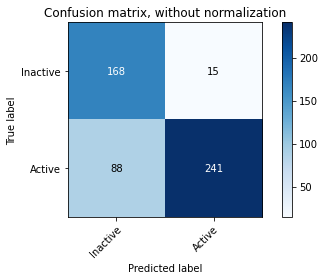

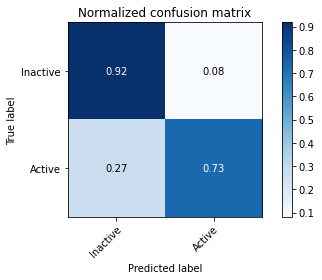

In [40]:
y_pred = lda.fit(X_train, y_train).predict(X_test)
# Plot non-normalized confusion matrix
class_names = np.array(["Inactive","Active"])
plot_confusion_matrix(np.array(y_test), y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [41]:
vn=167
vp=241
fn=88
fp=16
Sensibilidade=100*vp/(vp+fn)
Seletividade=100*vn/(vn+fp)
Exatidão=100*(vp+vn)/(vp+fn+fp+vn)

print("Os parametros do Modelo Classificatorio criado são:\nSensibilidade de {:.2f}% \nSeletividade de {:.2f}% \nExatidão de {:.2f}%".format(Sensibilidade,Seletividade,Exatidão))

Os parametros do Modelo Classificatorio criado são:
Sensibilidade de 73.25% 
Seletividade de 91.26% 
Exatidão de 79.69%


# PCA vs LDA

explained variance ratio (first two components): [0.13640107 0.03231755 0.02821986 0.02444084 0.0201374  0.01748616
 0.01675012 0.01419316 0.0130123  0.01255547 0.01200779 0.01074737
 0.01058752 0.0101386  0.01000544 0.00917702 0.00856432 0.00778564
 0.0071573  0.00701499 0.00647134 0.00628686 0.00595348 0.00564586
 0.00548123 0.00534344 0.0051267  0.00486049 0.00477904 0.00463787
 0.00454051 0.00436109 0.00430995 0.004156   0.00405014 0.00397103
 0.00385479 0.00381314 0.00371251 0.00368733 0.00351183 0.00347085
 0.00333049 0.00323174 0.00321698 0.0031803  0.00305375 0.00297849
 0.00294858 0.00291738 0.0028966  0.00283937 0.00281675 0.00275082
 0.00266807 0.00263489 0.00260455 0.00258432 0.00255319 0.00252418
 0.00251368 0.00247589 0.00242491 0.00241274 0.00237248 0.00235555
 0.00233678 0.00231574 0.00228607 0.002228   0.0022076  0.00218249
 0.00214422 0.00210952 0.00207193 0.00204878 0.00202926 0.00201081
 0.00199531 0.00195531 0.0019222  0.00190605 0.00187587 0.0018715
 0.00186242 0.

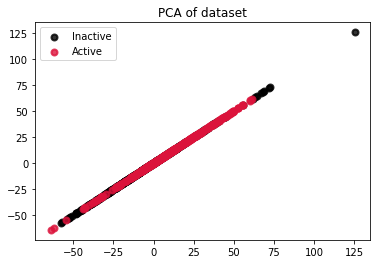

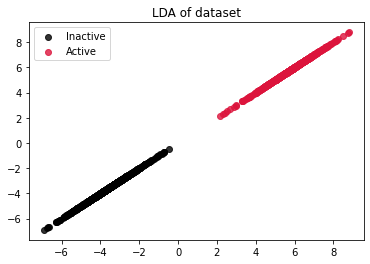

In [42]:
import matplotlib.pyplot as plt

target_names = class_names


X_trainr = pca.fit(X_train).transform(X_train)

lda475 = LinearDiscriminantAnalysis()
X_trainr2 = lda475.fit(X_train, y_train).transform(X_train)

# Percentage of variance explained for each components
print('explained variance ratio (first two components): %s'
      % str(pca.explained_variance_ratio_))

plt.figure()
colors = ['black',"crimson"]
lw = 2

for color, i, target_name in zip(colors, [0,1], target_names):
    plt.scatter(X_trainr[np.array(y_train) == i,0], X_trainr[np.array(y_train) ==i, 0], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA of dataset')


plt.figure()
for color, i,  target_name in zip(colors,[0,1], target_names):
    plt.scatter(X_trainr2[np.array(y_train)==i,0], X_trainr2[np.array(y_train) ==i,0], alpha=.8, color=color,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('LDA of dataset')

plt.show()



# ANALISE PELO METODO QDA

In [43]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
qda.fit(X_train,y_train)
print(qda.score(X_train,y_train))
print(qda.predict_proba(X_test))

C:\Users\danie\anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:715: UserWarning:

Variables are collinear



1.0
[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [0. 1.]
 [0. 1.]]


C:\Users\danie\anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:715: UserWarning:

Variables are collinear



Confusion matrix, without normalization
[[153  30]
 [ 64 265]]
Normalized confusion matrix
[[0.83606557 0.16393443]
 [0.19452888 0.80547112]]


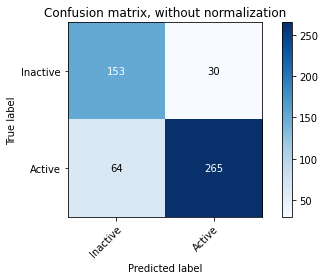

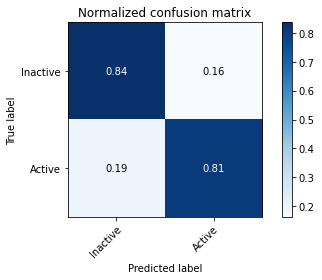

In [44]:
y_pred = qda.fit(X_train, y_train).predict(X_test)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [57]:
vn=153
vp=265
fn=64
fp=30
Sensibilidade=100*vp/(vp+fn)
Seletividade=100*vn/(vn+fp)
Exatidão=100*(vp+vn)/(vp+fn+fp+vn)

print("Os parametros do Modelo Classificatorio criado são:\nSensibilidade de {:.2f}% \nSeletividade de {:.2f}% \nExatidão de {:.2f}%".format(Sensibilidade,Seletividade,Exatidão))

Os parametros do Modelo Classificatorio criado são:
Sensibilidade de 80.55% 
Seletividade de 83.61% 
Exatidão de 81.64%


# ANALISE PELO METODO SVM

In [46]:
from sklearn.svm import SVC
svc = SVC(C=900,gamma="scale",decision_function_shape= 'ovo', kernel= 'rbf')
svc.fit(X_train,y_train)
print(svc.score(X_train,y_train))
print(svc.predict(X_train))

1.0
[0 1 1 ... 1 1 0]


Confusion matrix, without normalization
[[179   4]
 [ 79 250]]
Normalized confusion matrix
[[0.97814208 0.02185792]
 [0.24012158 0.75987842]]


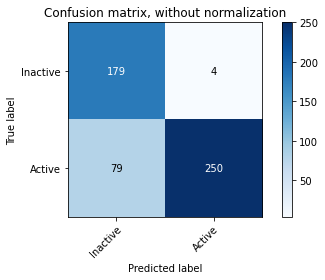

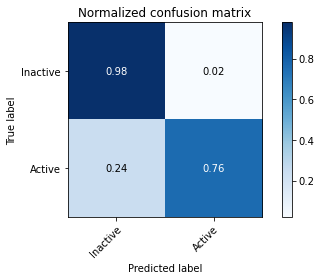

In [47]:
y_pred = svc.fit(X_train, y_train).predict(X_test)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [58]:
vn=179
vp=250
fn=79
fp=4
Sensibilidade=100*vp/(vp+fn)
Seletividade=100*vn/(vn+fp)
Exatidão=100*(vp+vn)/(vp+fn+fp+vn)

print("Os parametros do Modelo Classificatorio criado são:\nSensibilidade de {:.2f}% \nSeletividade de {:.2f}% \nExatidão de {:.2f}%".format(Sensibilidade,Seletividade,Exatidão))

Os parametros do Modelo Classificatorio criado são:
Sensibilidade de 75.99% 
Seletividade de 97.81% 
Exatidão de 83.79%


In [ ]:
from sklearn.model_selection import GridSearchCV
parameters_SVC = {"C":range(40,900)
                  ,"kernel":("rbf","poly","sigmoid"),
                  "gamma":("scale","auto"),
                  "decision_function_shape":("ovo","ovr")
                                            }
SVC_grid = GridSearchCV(svc, parameters_SVC, cv=4)
SVC_grid.fit(X_train,y_train)
print(SVC_grid.score(X_train,y_train))
print(SVC_grid.predict(X_test))
print(SVC_grid.best_params_)

# ANALISE PELO METODO MLPC

In [49]:
from sklearn.neural_network import MLPClassifier
MLPC = MLPClassifier(solver='adam', alpha=1e-10,
                    hidden_layer_sizes=(70,60), random_state=200)
MLPC.fit(X_train, y_train)   

MLPClassifier(alpha=1e-10, hidden_layer_sizes=(70, 60), random_state=200)

In [50]:
MLPC.predict(X_test)

array([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,

In [51]:
MLPC.predict_proba(X_test)

array([[5.91988900e-05, 9.99940801e-01],
       [4.99545038e-03, 9.95004550e-01],
       [5.91988900e-05, 9.99940801e-01],
       ...,
       [9.99986119e-01, 1.38812409e-05],
       [5.91988900e-05, 9.99940801e-01],
       [5.91988900e-05, 9.99940801e-01]])

Confusion matrix, without normalization
[[177   6]
 [ 27 302]]
Normalized confusion matrix
[[0.96721311 0.03278689]
 [0.08206687 0.91793313]]


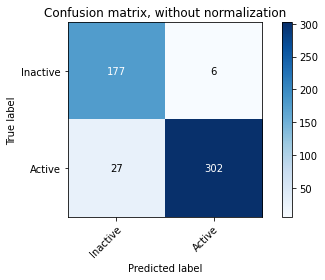

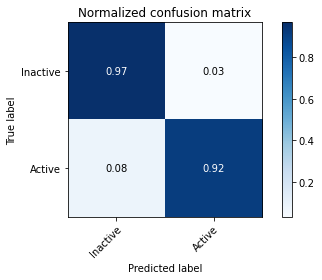

In [52]:
y_pred = MLPC.fit(X_train, y_train).predict(X_test)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [59]:
vn=177
vp=302
fn=27
fp=6
Sensibilidade=100*vp/(vp+fn)
Seletividade=100*vn/(vn+fp)
Exatidão=100*(vp+vn)/(vp+fn+fp+vn)

print("Os parametros do Modelo Classificatorio criado são:\nSensibilidade de {:.2f}% \nSeletividade de {:.2f}% \nExatidão de {:.2f}%".format(Sensibilidade,Seletividade,Exatidão))

Os parametros do Modelo Classificatorio criado são:
Sensibilidade de 91.79% 
Seletividade de 96.72% 
Exatidão de 93.55%


In [ ]:
parameters_MLPC = {"hidden_layer_sizes":(range(50,75,5),range(50,75,5)),
                   "solver":["adam"],
                   "alpha":[0.0001,0.0000000001],
                   "random_state":[1,200]}
MLPC_grid = GridSearchCV(MLPC, parameters_MLPC, cv=4)
MLPC_grid.fit(X_train,y_train)
print(MLPC_grid.score(X_train,y_train))
print(MLPC_grid.predict(X_test))
print(MLPC_grid.best_params_)

# ANALISE PELO METODO K-NN

In [54]:
from sklearn.neighbors import KNeighborsClassifier
knn= KNeighborsClassifier(n_neighbors=246)
knn.fit(X_train,y_train)
print(knn.score(X_train,y_train))
print(knn.predict_proba(X_test))

0.7447916666666666
[[0.49593496 0.50406504]
 [0.82926829 0.17073171]
 [0.49593496 0.50406504]
 ...
 [0.80894309 0.19105691]
 [0.49593496 0.50406504]
 [0.49593496 0.50406504]]


Confusion matrix, without normalization
[[170  13]
 [145 184]]
Normalized confusion matrix
[[0.92896175 0.07103825]
 [0.44072948 0.55927052]]


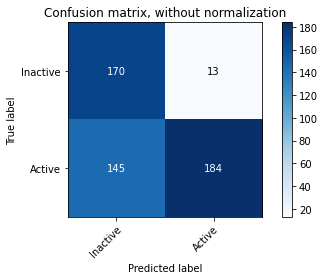

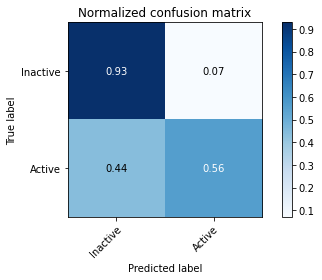

In [55]:
y_pred = knn.fit(X_train, y_train).predict(X_test)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

In [60]:
vn=170
vp=184
fn=145
fp=13
Sensibilidade=100*vp/(vp+fn)
Seletividade=100*vn/(vn+fp)
Exatidão=100*(vp+vn)/(vp+fn+fp+vn)

print("Os parametros do Modelo Classificatorio criado são:\nSensibilidade de {:.2f}% \nSeletividade de {:.2f}% \nExatidão de {:.2f}%".format(Sensibilidade,Seletividade,Exatidão))

Os parametros do Modelo Classificatorio criado são:
Sensibilidade de 55.93% 
Seletividade de 92.90% 
Exatidão de 69.14%


In [ ]:
knn_grid = GridSearchCV(knn,{'n_neighbors':range(240,250)},cv=4)
knn_grid.fit(X_train,y_train)
print(knn_grid.score(X_train,y_train))
print(knn_grid.best_params_)